In [2]:
import cv2
from matplotlib import pyplot as plt
%matplotlib widget
import ipywidgets as widgets
import numpy as np

ModuleNotFoundError: No module named 'ipython_genutils'

In [ ]:
# read image file from disk
img = cv2.imread('finger.png')

In [3]:
# OpenCV images are numpy array
# order: height, width, channels
img.shape

(800, 1000, 3)

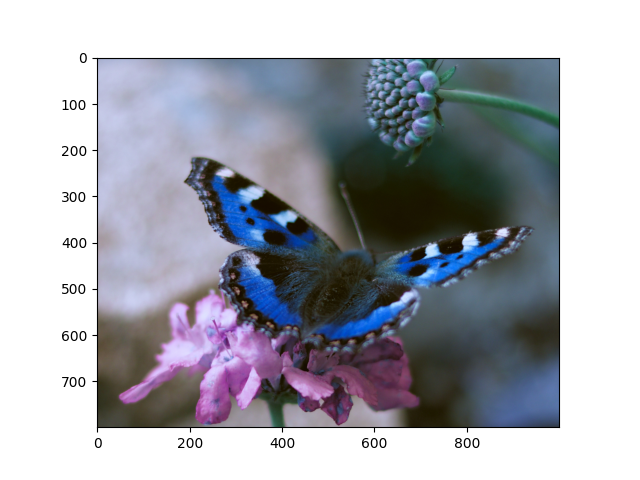

In [4]:
fig = plt.figure()

# we use pyplot to show images in the notebook
# for standalone applications, use cv2.imshow()
plt.imshow(img)

## Convert between color spaces

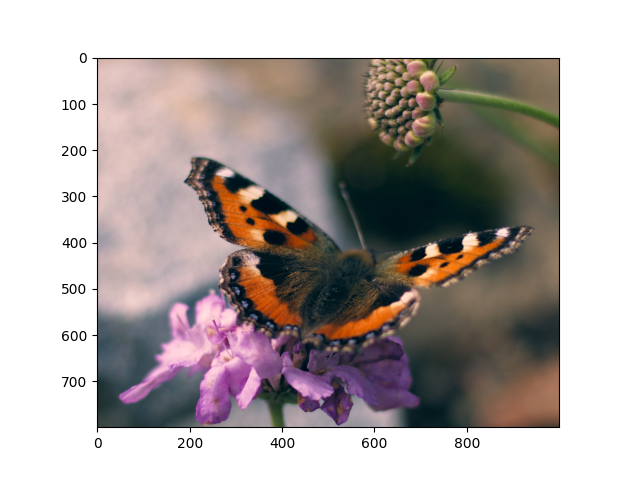

In [5]:
fig = plt.figure()

img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)

## Crop Image

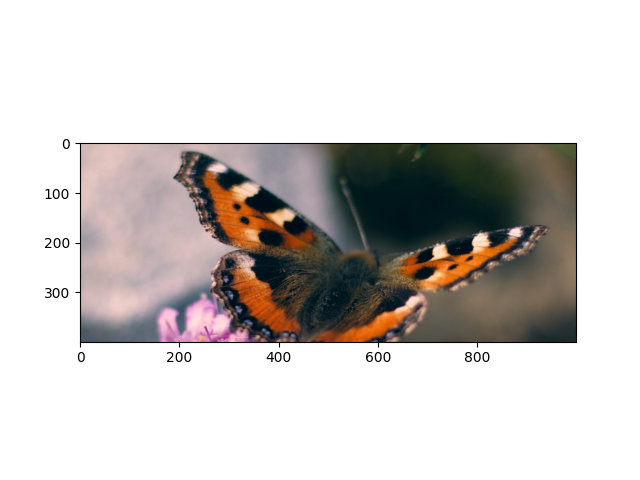

In [6]:
fig = plt.figure()

img_cropped = img[200:-200]

img_rgb = cv2.cvtColor(img_cropped, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)

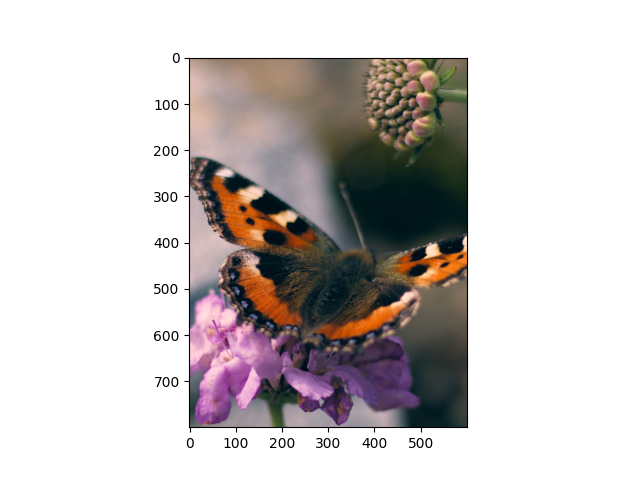

In [7]:
fig = plt.figure()

img_cropped = img[:, 200:-200]

img_rgb = cv2.cvtColor(img_cropped, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)

## Extract Color Channel

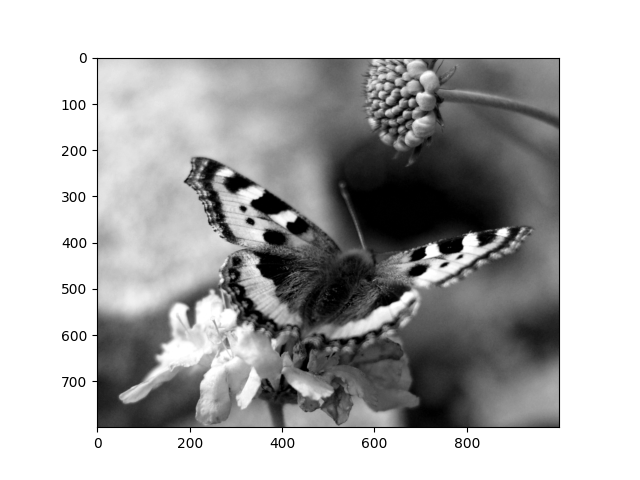

In [8]:
fig = plt.figure()

img_red = img[:, :, 2]

plt.imshow(img_red, 'gray')

## Drawing Shapes

https://docs.opencv.org/3.4/d3/d96/tutorial_basic_geometric_drawing.html

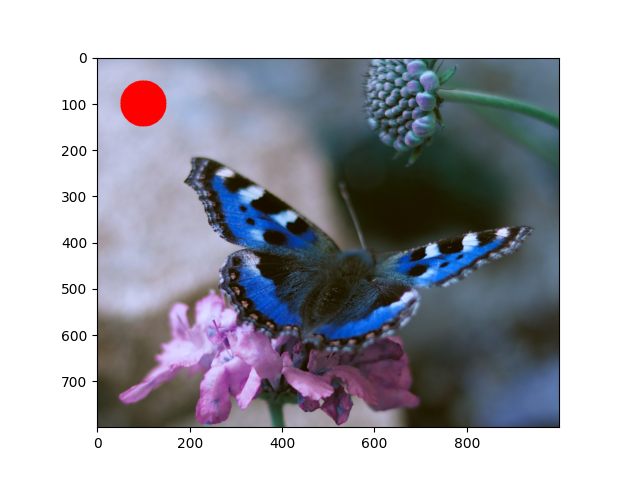

In [9]:
fig = plt.figure()

img_with_shape = img

position = (100, 100)
radius = (50)
color = (255, 0, 0)
border_width = -1 # -1 means that the shape is filled

img_with_shape = cv2.circle(img_with_shape, position, radius, color, border_width)

plt.imshow(img_with_shape)

## Ooops?

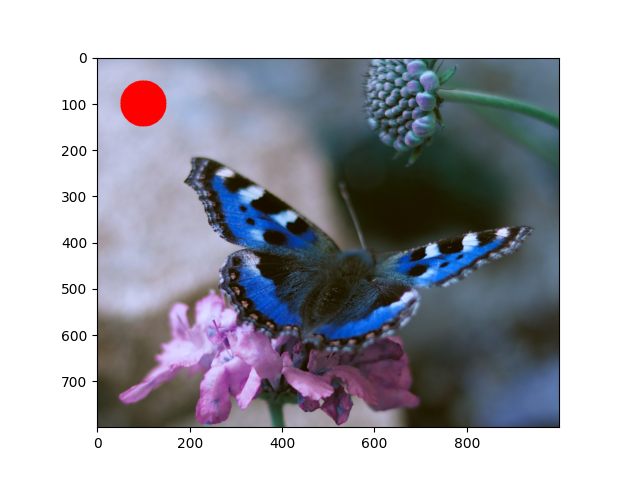

In [10]:
fig = plt.figure()

plt.imshow(img)

## Deep Copy

The '=' operator assigns images *by reference* - this is very fast, but changes also effect the original image.
If the original should be preserved, create a deep copy using the .cop() function.

Attention! Deep copying large images is very slow and memory intensive. Try to avoid it in critical paths unless necessary.

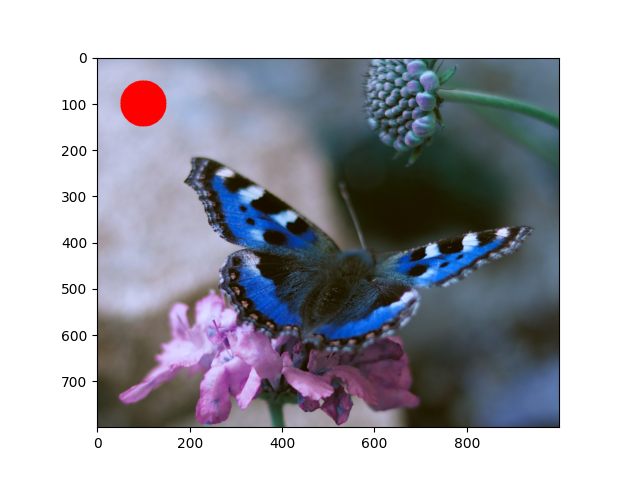

In [11]:
img = cv2.imread('butterfly.jpg')

fig = plt.figure()

img_with_shape = img.copy()

position = (100, 100)
radius = (50)
color = (255, 0, 0)
border_width = -1 # -1 means that the shape is filled

img_with_shape = cv2.circle(img_with_shape, position, radius, color, border_width)

plt.imshow(img_with_shape)

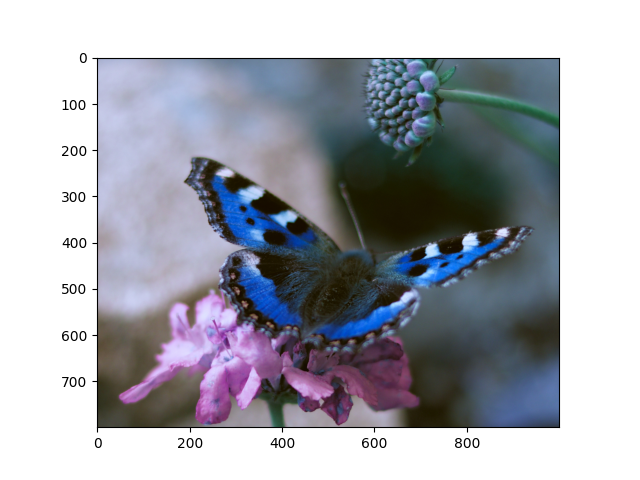

In [12]:
fig = plt.figure()

plt.imshow(img)

## Threshold

https://docs.opencv.org/4.x/d7/d4d/tutorial_py_thresholding.html

In [13]:
cutoff = 128
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(img_gray, cutoff, 255, cv2.THRESH_BINARY)
plt.imshow(thresh, 'gray')

/tmp/ipykernel_17156/924611987.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(1, 2, figsize=(12, 5))


interactive(children=(IntSlider(value=128, description='threshold', max=255), Dropdown(description='method', o…

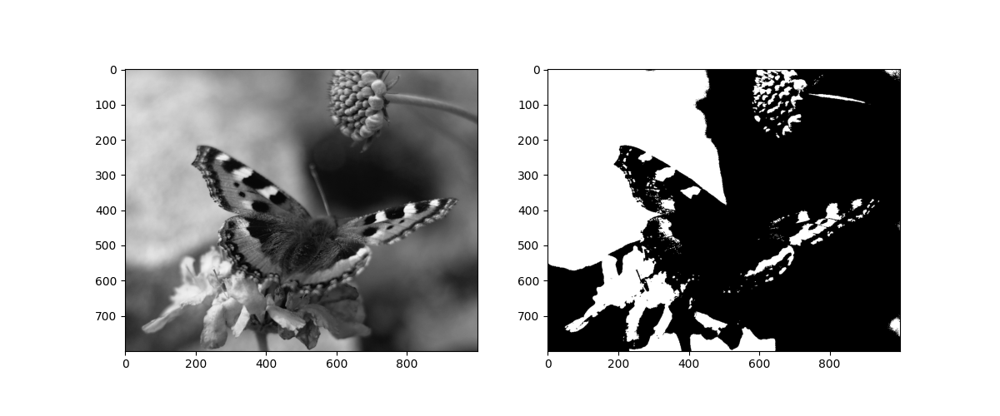

: 

In [25]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
axes[0].imshow(img_gray, 'gray')

@widgets.interact(threshold=(0, 255, 1), method=['BINARY', 'BINARY_INV', 'TRUNC', 'TOZERO', 'TOZERO_INV'])
def update(threshold=128, method='BINARY'):
    axes[1].clear()
    
    if method == 'BINARY':
        ret, thresh = cv2.threshold(img_gray, threshold, 255, cv2.THRESH_BINARY)
    elif method == 'BINARY_INV':
        ret, thresh = cv2.threshold(img_gray, threshold, 255, cv2.THRESH_BINARY_INV)
    elif method == 'TRUNC':
        ret, thresh = cv2.threshold(img_gray, threshold, 255, cv2.THRESH_TRUNC)
    elif method == 'TOZERO':
        ret, thresh = cv2.threshold(img_gray, threshold, 255, cv2.THRESH_TOZERO)
    elif method == 'TOZERO_INV':
        ret, thresh = cv2.threshold(img_gray, threshold, 255, cv2.THRESH_TOZERO_INV)
        
    axes[1].imshow(thresh, 'gray')

## Adaptive Threshold

Tries to threshold the image locally in a defined neighbourhood (block_size).

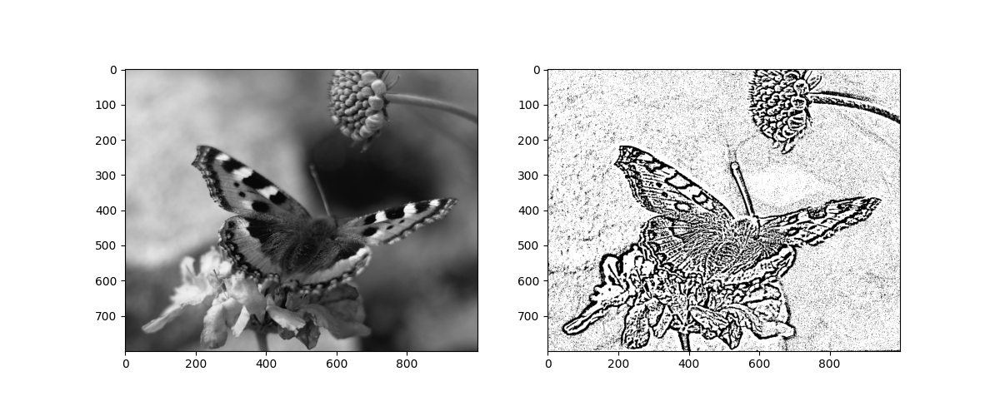

In [15]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
axes[0].imshow(img_gray, 'gray')

block_size = 11

thresh_adaptive = cv2.adaptiveThreshold(img_gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, block_size, 2)
axes[1].imshow(thresh_adaptive, 'gray')

## Blur

interactive(children=(IntSlider(value=3, description='kernel_size', max=121, min=3, step=2), Output()), _dom_c…

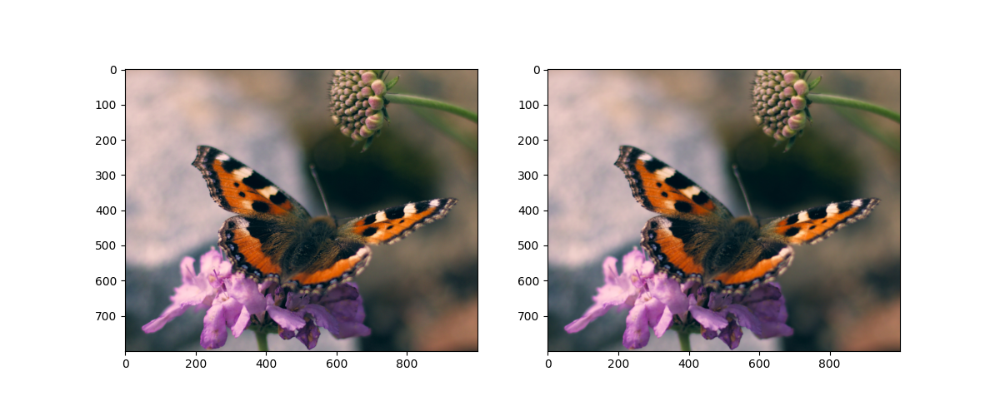

In [16]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
axes[0].imshow(img_rgb)

@widgets.interact(kernel_size=(3, 121, 2))
def update(kernel_size=3):
    img_blur = cv2.GaussianBlur(img_rgb, (kernel_size, kernel_size), 0)
    axes[1].imshow(img_blur)

## Convolution

Images can be regarded as 2D signals.
Just like with 1D signals, we can convolve images to filter them.
Kernels also have to be 2D in this case.

https://docs.opencv.org/4.x/d4/d13/tutorial_py_filtering.html

interactive(children=(IntSlider(value=3, description='kernel_size', max=121, min=3, step=2), Dropdown(descript…

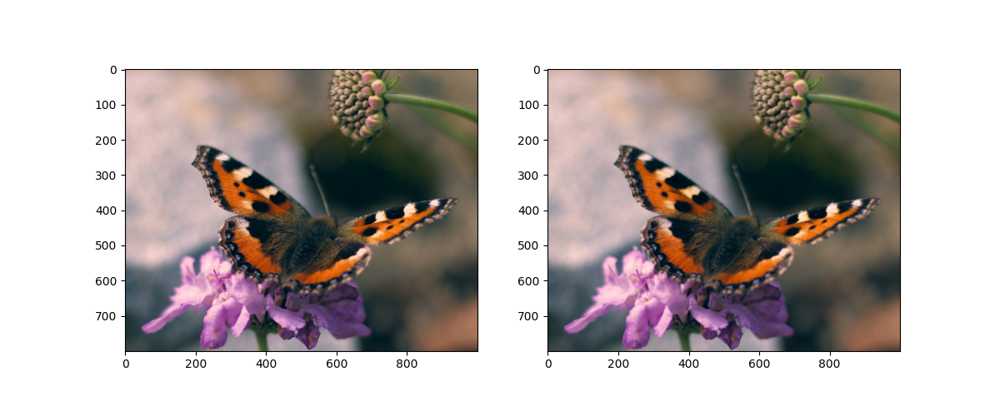

In [17]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
axes[0].imshow(img_rgb)

@widgets.interact(kernel_size=(3, 121, 2), method=['blur', 'sharpen'])
def update(kernel_size=3, method='blur'):
    if method == 'blur':
        # convolving a uniform kernel applies a box blur to the image
        kernel = np.ones((kernel_size, kernel_size), np.float64)
        kernel /= (kernel_size**2)
    else:
        # convolving a kernel with negative values around the center and a high positive value in the center sharpens the image
        # use small kernels as this filter is very agressive
        kernel = np.ones((kernel_size, kernel_size), np.float64)
        kernel *= -1
        kernel[kernel_size // 2, kernel_size // 2] = kernel_size**2
    
    img_blur = cv2.filter2D(img_rgb, -1, kernel)
    axes[1].imshow(img_blur)

## Morphology
https://docs.opencv.org/3.4/db/df6/tutorial_erosion_dilatation.html

Morphology operations are very useful to remove noise and connect/disconnect elements in images.

**Erosion:** Convolve kernel over image. Current pixel value = minimum value covered by the kernel. Bright regions get smaller.

**Dilation:** Convolve kernel over image. Current pixel value = maximum value covered by the kernel. Bright regions get bigger.

**Opening:** Erosion followed by dilation.

**Closing:** Dilation followed by erosion.

interactive(children=(IntSlider(value=3, description='kernel_size', max=9, min=3, step=2), Dropdown(descriptio…

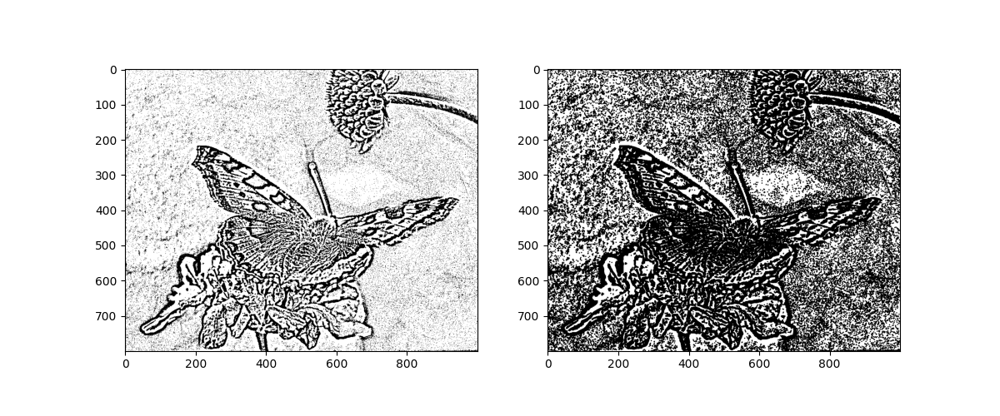

In [18]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
block_size = 11
thresh_adaptive = cv2.adaptiveThreshold(img_gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, block_size, 2)

thresh_adaptive = cv2.cvtColor(thresh_adaptive, cv2.COLOR_BGR2RGB)
axes[0].imshow(thresh_adaptive, 'gray')

@widgets.interact(kernel_size=(3, 9, 2), method=['erode', 'dilate', 'open', 'close'])
def update(kernel_size=3, method='blur'):
    kernel = np.ones((kernel_size, kernel_size), dtype=np.float64)

    erosion = cv2.erode(thresh_adaptive, kernel)

    dilation = cv2.dilate(thresh_adaptive, kernel)
    
    # erode, then dilate
    opening = cv2.dilate(erosion, kernel)
    
    # dilate, then erode
    closing = cv2.erode(dilation, kernel)

    erosion = cv2.cvtColor(erosion, cv2.COLOR_BGR2RGB)
    dilation = cv2.cvtColor(dilation, cv2.COLOR_BGR2RGB)
    opening = cv2.cvtColor(opening, cv2.COLOR_BGR2RGB)
    closing = cv2.cvtColor(closing, cv2.COLOR_BGR2RGB)
    
    if method == 'erode':
        axes[1].imshow(erosion, 'gray')
    elif method == 'dilate':
        axes[1].imshow(dilation, 'gray')
    elif method == 'open':
        axes[1].imshow(opening, 'gray')
    elif method == 'close':
        axes[1].imshow(closing, 'gray')

## Contour Detection

interactive(children=(IntSlider(value=128, description='threshold', max=255), Output()), _dom_classes=('widget…

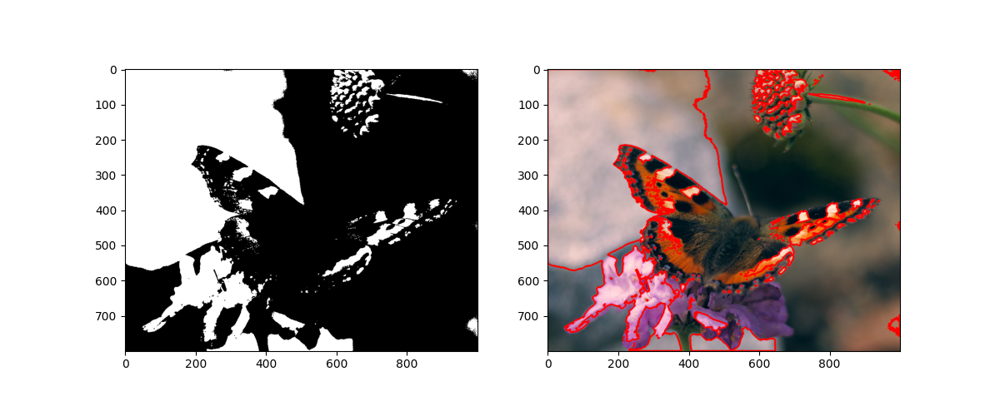

In [19]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

@widgets.interact(threshold=(0, 255, 1))
def update(threshold=128):
    axes[1].clear()
    
    ret, thresh = cv2.threshold(img_gray, threshold, 255, cv2.THRESH_BINARY)
    axes[0].imshow(thresh, 'gray')
    
    contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    
    img_contours = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_contours = cv2.drawContours(img_contours, contours, -1, (255, 0, 0), 3)
    
    axes[1].imshow(img_contours)

## Masking

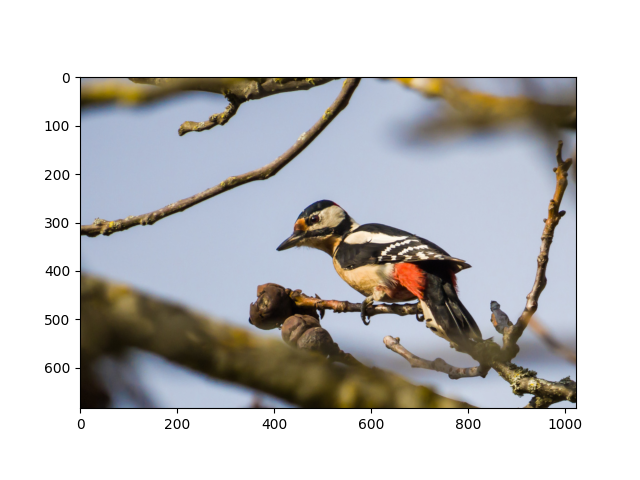

In [20]:
fig = plt.figure()

img_2 = cv2.imread('sparrow.jpg')

img_2_rgb = cv2.cvtColor(img_2, cv2.COLOR_BGR2RGB)

plt.imshow(img_2_rgb)

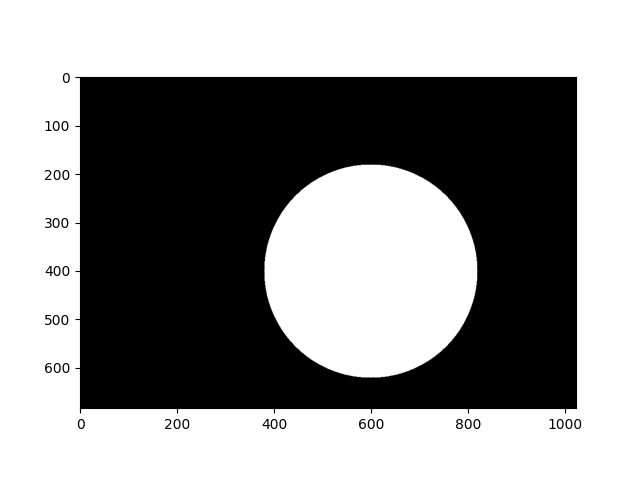

In [21]:
fig = plt.figure()

mask = np.zeros_like(img_2, dtype=np.uint8)

mask = cv2.circle(mask, (600, 400), 220, (255, 255, 255), -1)

plt.imshow(mask, 'gray')

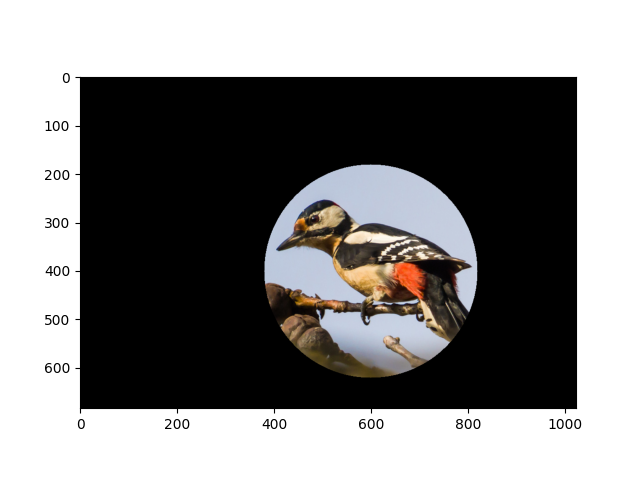

In [22]:
fig = plt.figure()

masked = np.bitwise_and(img_2_rgb, mask)

plt.imshow(masked)

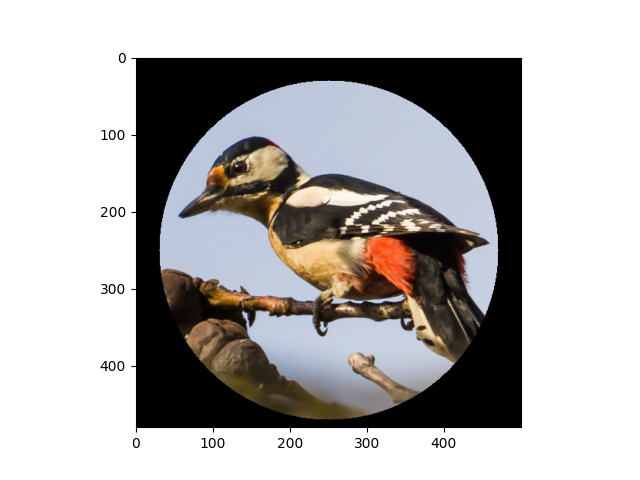

In [23]:
fig = plt.figure()

masked_cropped = masked[150:630, 350:850, :]

plt.imshow(masked_cropped)

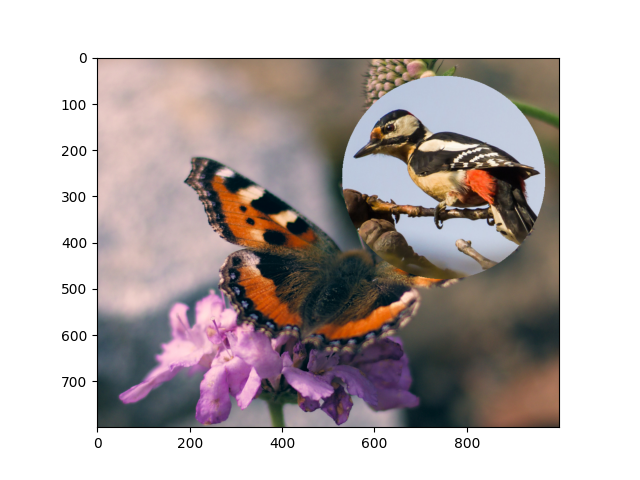

In [24]:
fig = plt.figure()

x = 500
y = 10
h, w, _ = masked_cropped.shape

overlay = np.zeros_like(img_rgb, np.uint8) # create overlay with size of background image
overlay[y:y+h, x:x+w, :] = masked_cropped # insert masked and cropped image into overlay
mask = overlay.astype(bool) # create mask from overlay

combined = img_rgb.copy()

combined[mask] = cv2.addWeighted(img_rgb, 0, overlay, 1, 0)[mask]

plt.imshow(combined)